<a href="https://colab.research.google.com/github/sungulnara2000/CrumpledDocumentsDataset/blob/master/documents_generation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Настройка среды

In [ ]:
!pip install opencv-contrib-python==3.4.2.17
!pip install -U plotly==4.12
!pip install pyheif Pillow
!pip install pdf2image
!apt-get install poppler-utils
!pip install alphashape

In [ ]:
!git clone https://github.com/sungulnara2000/CrumpledDocumentsDataset.git
!gdown --id 1ZUATVSd94uX7K_iSXVAAgkfYAFApV3KC
!unzip paper_distortions.zip -d CrumpledDocumentsDataset

In [10]:
import os
import glob

import numpy as np
from tqdm import tqdm
import itertools
import random

from scipy import interpolate

import cv2 as cv
from google.colab.patches import cv2_imshow

import matplotlib.pyplot as plt
from IPython.display import clear_output

from multiprocessing import Pool

In [11]:
%load_ext autoreload
%autoreload 2

In [12]:
os.chdir('/content/CrumpledDocumentsDataset')

In [13]:
from src import config, utils, detection, ordering, inpainting
from src.distortion import Distortion
from src.augmentation import Augmentation

Преобразуем фотографии формата HEIC в PNG, если такие имеются

In [ ]:
utils.convert_heic_to_png(config.CRUMPLED_GRIDS_FOLDER, delete=True)
utils.convert_heic_to_png(config.BACKGROUND_FOLDER, delete=True)

0it [00:00, ?it/s]
100%|██████████| 10/10 [01:04<00:00,  6.48s/it]


Преобразуем PDF документы в картинки со страницами этих документов (запускать, если есть новые документы которые нужно преобразовать)

In [ ]:
# преобразование документов по отдельности

# for f in ['functional_analysis.pdf', 'mouse.pdf', '2002_09589.pdf', '2102_12092.pdf']:
#   utils.convert_single_pdf_to_image(
#       os.path.join(config.EDOCS_PDF_FOLDER, f), 
#       config.EDOCS_FOLDER)

In [ ]:
# преобразование всех документов в папке

# utils.convert_pdf_to_image(config.EDOCS_PDF_FOLDER, config.EDOCS_FOLDER)

100%|██████████| 6/6 [00:48<00:00,  8.10s/it]


# Предобработка

В этом разделе обрабатываются фотографии смятых сеток: 
* найденные координаты и размеры ключевых точек сохраняются в config.KEY_POINTS_FOLDER
* результаты замазывания маркеров сохраняются в config.INPAINTED_FOLDER

In [ ]:
def prepare_crumple(crumpled_grid_path):
  try:
    key_points = detection.detect_markers(crumpled_grid_path)
    inpainting.inpaint_key_points(crumpled_grid_path, key_points, gray=True)
    print('DONE: ', os.path.basename(crumpled_grid_path))
  except:
    failed.append(crumpled_grid_path)
    print('ERROR: ', os.path.basename(crumpled_grid_path))

In [ ]:
# crumpled_grid_paths = glob.glob(f'{config.CRUMPLED_GRIDS_FOLDER}/*')
# failed = []

# with Pool(2) as p:
#   p.map(prepare_crumple, crumpled_grid_paths)

# Смятие

In [14]:
GENERATORS = {}

for name, source_folder in zip(
    ['grid', 'document', 'background'],
    [config.CRUMPLED_GRIDS_FOLDER, config.EDOCS_FOLDER, config.BACKGROUND_FOLDER]):
  
  image_list = glob.glob(f"{source_folder}/*")
  random.shuffle(image_list)
  GENERATORS[name] = itertools.cycle(image_list)

In [27]:
SHOW_SIZE = (1512, 2016)
INPUT_SIZE = (3312, 4678)

In [28]:
def generate_crumpled_documents(use_n_grids, n_augmentations, plot=False):
  for i in tqdm(range(use_n_grids)):
    grid = next(GENERATORS['grid'])
    document = next(GENERATORS['document'])
    background = next(GENERATORS['background'])

    print('\n', os.path.basename(grid))

    try:
      dist = Distortion(grid, INPUT_SIZE)
      transformed = dist.transform(
        document, 
        background,
        resize=True)
      
      save_name = f'{utils.get_file_name(grid)}_{utils.get_file_name(document)}_{utils.get_file_name(background)}.png'
      cv.imwrite(os.path.join(config.CRUMPLED_RESULTS_FOLDER, save_name), transformed)

      if plot:
        print('\nСмятый документ')
        cv2_imshow(cv.resize(transformed, SHOW_SIZE))
    
      for j in tqdm(range(n_augmentations)):
        aug = Augmentation(dist)

        document = next(GENERATORS['document'])
        background = next(GENERATORS['background'])

        transformed_aug = aug.transform(
          document, 
          background,
          resize=True)
        
        save_name = f'{utils.get_file_name(grid)}_{utils.get_file_name(document)}_{utils.get_file_name(background)}_NUM_{j}.png'
        cv.imwrite(os.path.join(config.AUGMENTATIONS_FOLDER, save_name), transformed_aug)
      
        if plot:
          print('\nАугментации')
          cv2_imshow(cv.resize(transformed_aug, SHOW_SIZE))

    except Exception as e: 
      print('\nerror\n')
      with open('exceptions.txt', 'a') as f:
        f.write('-----------------------------------------' + '\n')
        f.write(grid + '\n')
        f.write('\n' + str(e) + '\n')

  0%|          | 0/5 [00:00<?, ?it/s]


 IMG_4362.png


 20%|██        | 1/5 [00:00<00:03,  1.13it/s]


error


 IMG_4279.png


 40%|████      | 2/5 [00:01<00:01,  1.53it/s]


error


 IMG_4335.png


 60%|██████    | 3/5 [00:02<00:01,  1.56it/s]


error


 IMG_4347.png


 80%|████████  | 4/5 [00:02<00:00,  1.77it/s]


error


 IMG_4283.png

Смятый документ


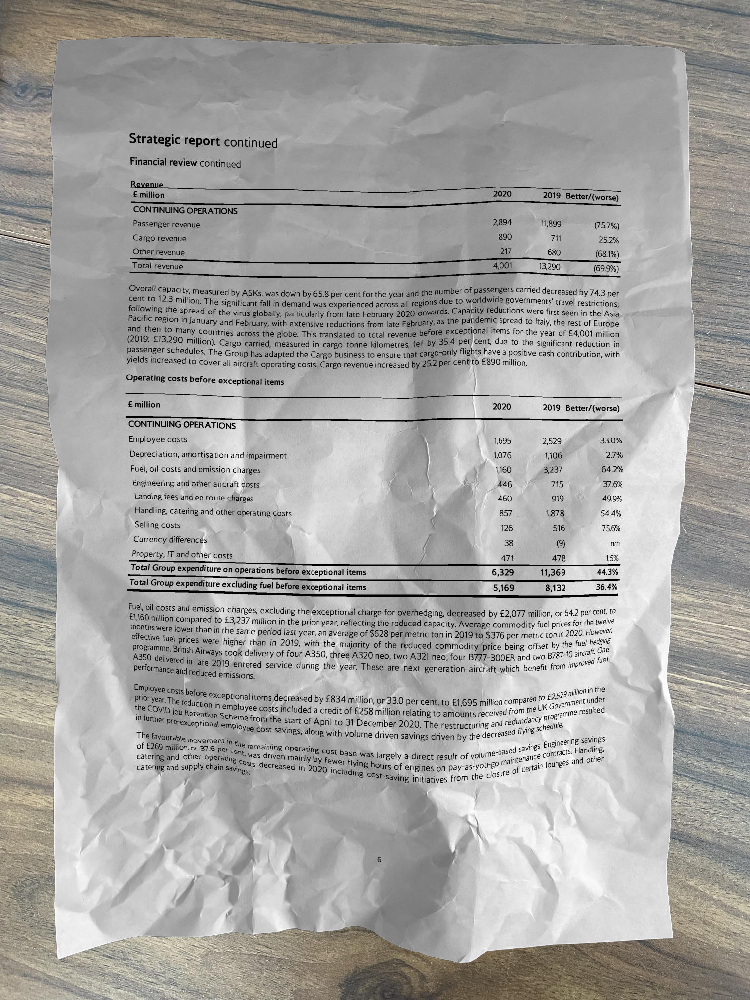


  0%|          | 0/2 [00:00<?, ?it/s]


Аугментации


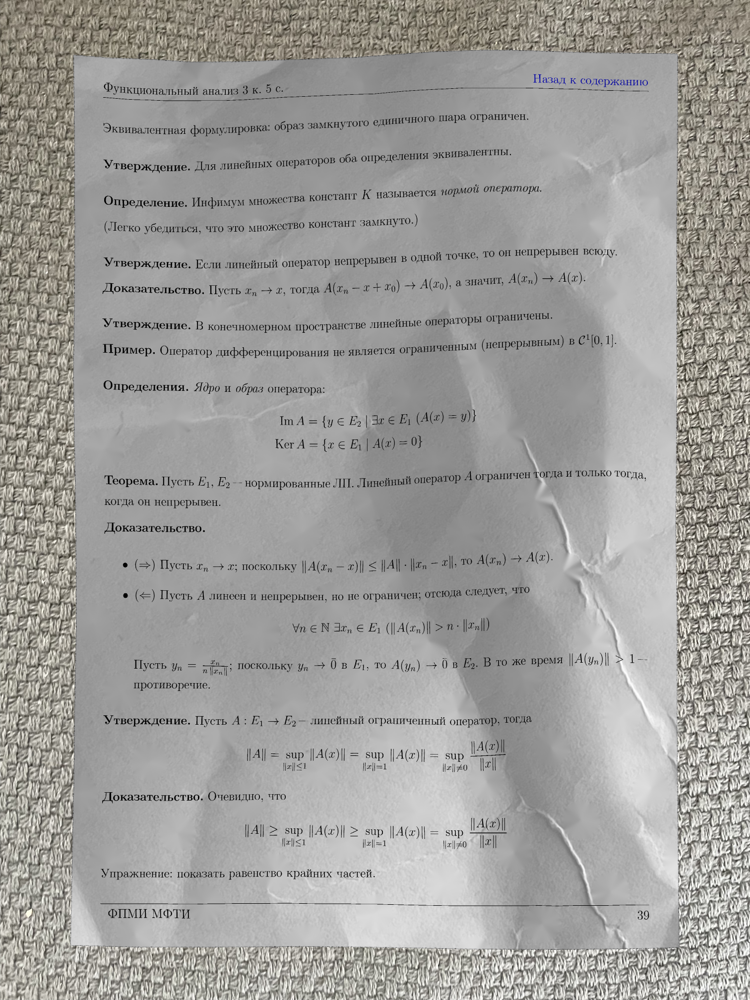


 50%|█████     | 1/2 [00:11<00:11, 11.21s/it]


Аугментации


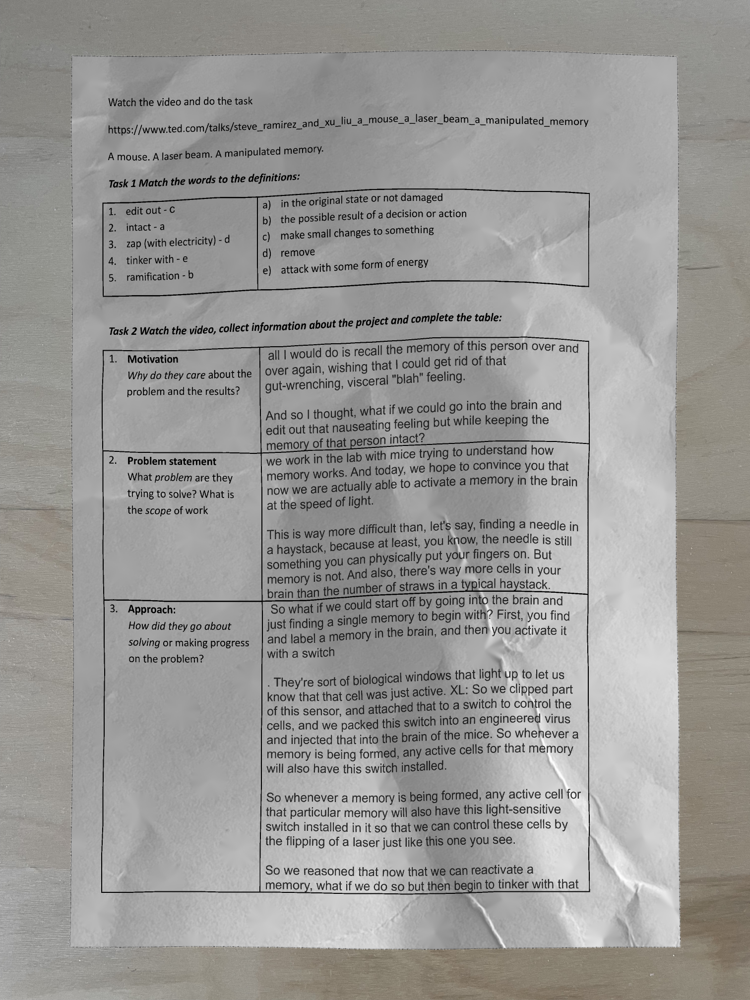


100%|██████████| 5/5 [00:36<00:00,  7.30s/it]


In [29]:
generate_crumpled_documents(use_n_grids=5, n_augmentations=2, plot=True)